In [19]:
import pandas as pd
import numpy as np

In [20]:
train_df = pd.read_csv("./data/train.csv")
test_df = pd.read_csv("./data/test.csv")
validation_df = pd.read_csv("./data/validation.csv")

In [21]:
total_dataset = len(train_df) + len(test_df) + len(validation_df)

In [22]:
total_dataset

1413

In [12]:
train_df

,Unnamed: 0,song_path,artist
0,0,../mp3s-32k/metallica/Master_of_Puppets/05-Dis...,metallica
1,1,../mp3s-32k/metallica/Master_of_Puppets/01-Bat...,metallica
2,2,../mp3s-32k/metallica/Master_of_Puppets/03-Thi...,metallica
3,3,../mp3s-32k/metallica/Master_of_Puppets/07-Ori...,metallica
4,4,../mp3s-32k/metallica/Master_of_Puppets/06-Lep...,metallica
...,...,...,...
1049,1049,../mp3s-32k/garth_brooks/The_Chase/02-Somewher...,garth_brooks
1050,1050,../mp3s-32k/garth_brooks/The_Chase/01-We_Shall...,garth_brooks
1051,1051,../mp3s-32k/garth_brooks/The_Chase/05-Walking_...,garth_brooks
1052,1052,../mp3s-32k/garth_brooks/The_Chase/07-Learning...,garth_brooks


In [13]:
len(train_df["artist"].unique())

20

Preprocess data train

In [14]:
sampling_rate = 16_000
hop_length = 512
fft_window_size = 2_048
n_mels = 128 #Number of Mel Bins

In [15]:
%matplotlib inline
import matplotlib.pyplot as plt, IPython.display as ipd

try:
    import librosa, librosa.display
except:
    !pip install librosa
    import librosa, librosa.display

# import stanford_mir; stanford_mir.init()

In [17]:
x, sr = librosa.load(path = "../data/artist20-mp3s-32k/artist20/mp3s_Song_32k/aerosmith/03-Adam_s_Apple.mp3", sr = sampling_rate)

S = librosa.feature.melspectrogram(y = x, 
                                   sr = sr, 
                                   n_fft = fft_window_size, 
                                   hop_length = hop_length, 
                                   n_mels =  n_mels)

In [18]:
logS = librosa.power_to_db(S, ref=1.0)

In [19]:
logS

array([[-48.965446, -48.965446, -48.965446, ..., -46.291   , -43.688133,
        -44.48671 ],
       [-48.965446, -48.965446, -48.965446, ..., -43.6994  , -46.43807 ,
        -43.984753],
       [-48.965446, -48.965446, -48.965446, ..., -39.370323, -43.57731 ,
        -44.740314],
       ...,
       [-48.965446, -48.965446, -48.965446, ..., -48.965446, -48.965446,
        -48.965446],
       [-48.965446, -48.965446, -48.965446, ..., -48.965446, -48.965446,
        -48.965446],
       [-48.965446, -48.965446, -48.965446, ..., -48.965446, -48.965446,
        -48.965446]], dtype=float32)

In [20]:
logS.max()

31.034555

In [21]:
logS.min()

-48.965446

In [22]:
split_Spectogram(spectrogram= logS, 
                     artist_name= "str", 
                     song_name= "str", 
                     pathSave="str", 
                     time_in_seconds = 3, 
                     hop_length= 256, 
                     sampling_rate=16_000)

FileNotFoundError: [Errno 2] No such file or directory: 'str/str-str-3sec-0.plk.gz'

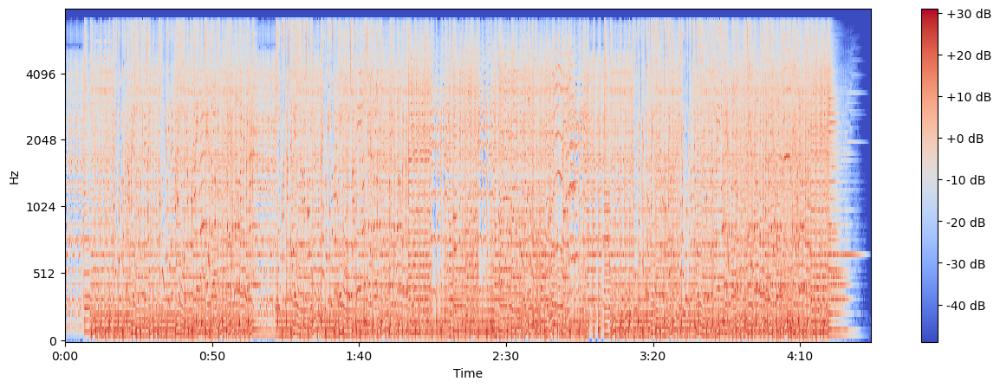

In [ ]:
plt.figure(figsize=(15, 5))
librosa.display.specshow(data = logS, sr = sr, hop_length=hop_length, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')

In [13]:
def plot_spectrogram(specgram, title=None, ylabel="freq_bin", ax=None):
    if ax is None:
        _, ax = plt.subplots(1, 1)
    if title is not None:
        ax.set_title(title)
    ax.set_ylabel(ylabel)
    ax.imshow(librosa.power_to_db(specgram), origin="lower", aspect="auto", interpolation="nearest")

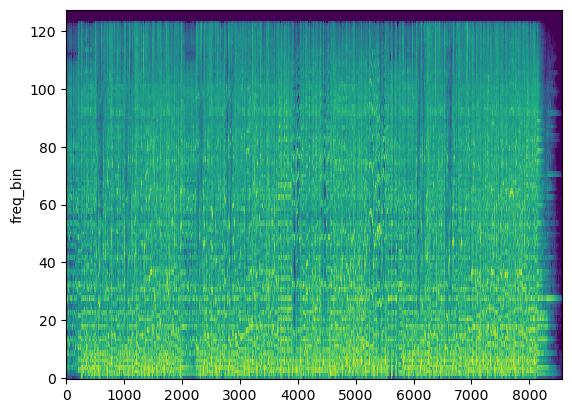

In [74]:
plot_spectrogram(S, title=None, ylabel="freq_bin", ax=None)

In [75]:
type(logS)

numpy.ndarray

Check song

In [76]:
ipd.Audio(x, rate=sr)

In [77]:
logS.shape

(128, 8564)

In [16]:
def get_spectrogram(songPath: str, 
                    sampling_rate: int = 16_000, 
                    hop_length: int = 512, 
                    fft_window_size:int = 2_048, 
                    n_mels:int = 128) -> (np.ndarray, int):
    
    x, sr = librosa.load(path = songPath, sr = sampling_rate)
    S = librosa.feature.melspectrogram(y = x, 
                                       sr = sr, 
                                       n_fft = fft_window_size, 
                                       hop_length = hop_length, 
                                       n_mels =  n_mels)
    return librosa.power_to_db(S, ref=1.0), sr



def plot_spectrogram(data, sr:int, hop_length:int = 256) -> None:
    plt.figure(figsize=(15, 5))
    librosa.display.specshow(data = data, sr =sr, hop_length=hop_length, x_axis='time', y_axis='mel')
    plt.colorbar(format='%+2.0f dB')
    plt.show()


def create_folder(folder_path : str)-> None:
    import os
    # Check if the folder exists
    if not os.path.exists(folder_path):
        # If it doesn't exist, create it
        os.makedirs(folder_path)
        print(f"Folder '{folder_path}' created successfully.")
    else:
        print(f"Folder '{folder_path}' already exists.")


def get_number_frames(time_in_seconds : int = 3, hop_length: int = 256, sampling_rate: int = 16_000) -> int:
    time_duration_frames = hop_length / sampling_rate
    return int(time_in_seconds / time_duration_frames)





def split_Spectogram(spectrogram: np.ndarray, 
                     artist_name: str, 
                     song_name: str, 
                     pathSave:str, 
                     time_in_seconds:int = 3, 
                     hop_length:int = 256, 
                     sampling_rate: int = 16_000) -> None:
    try:
        import os
    except: 
        !pip install os
        import os

    try:
        import gzip
    except: 
        !pip install gzip
        import gzip

    try:
        # import dill, os
        import  pickle
    except:
        # !pip install dill
        # !pip install os
        !pip install pickle
        import  pickle


    time_duration_frames = hop_length / sampling_rate
    window_size = int(np.ceil(time_in_seconds / time_duration_frames))
    raw_spectrogram = spectrogram

    # melspec = melspec.squeeze(0)
    width  = raw_spectrogram.shape[1]
   
   
    stride = int(window_size - 10)

    n_frames = (width - window_size)/stride + 1
    n_frames_int = int((width - window_size)/stride + 1)
    remainder, last_round = (n_frames_int, False)  if (n_frames -  n_frames_int) ==0 else (n_frames_int + 1, False) 

    start = 0
    end = window_size
    for round in range(remainder):
        if ~last_round and round == remainder-1:
            start = width - window_size
            end = width

        spectrogram_window = raw_spectrogram[:, start: end]

        if spectrogram_window.shape[1] !=0 and spectrogram_window.shape[1] == window_size:
            # print(start, end, end-start, spectrogram_window.size(), raw_spectrogram.size(), song_name)


            name_file = f"{artist_name}-{song_name}-{time_in_seconds}sec-{round}.plk.gz"
            # data = (artist_name, spectrogram_window, song_name)
            data = {
                "artist_name" : artist_name,
                "song_name": song_name,
                "time_ window_size": time_in_seconds,
                "spectrogram" : spectrogram_window
            }
        
            with gzip.open(os.path.join(pathSave, name_file), 'wb') as f:
                pickle.dump(data, f)

        start = end - stride
        end = start + window_size

    

def create_dataset_from_spectrogram(data_frame, folder_dataset:str = 'test', times:list = [1])-> None:
    sampling_rate = 16_000
    hop_length = 512
    fft_window_size = 2_048
    n_mels = 128 #Number of Mel Bins

    newPathDataset = f"./dataset/{folder_dataset}"
    create_folder(newPathDataset)

    for _, row in data_frame.iterrows():
        

        path = row['song_path'].replace('\\', '/')
        song_name = path.split('/')[-1].split("-")[-1].split(".mp3")[0]
    
        spectrogram, _ = get_spectrogram(path,  sampling_rate = sampling_rate, hop_length = hop_length, fft_window_size = fft_window_size, n_mels = n_mels)

        for time in times:
            split_Spectogram(spectrogram, 
                             row['artist'], 
                             song_name , 
                             newPathDataset, 
                             time_in_seconds = time, 
                             hop_length = hop_length, 
                             sampling_rate = sampling_rate)
            

def execute_algorithm_create_datasets(directory_path:str, file_name:list, time_frame:list = [30]):
    file = file_name.split(".csv")[0]
    df = pd.read_csv(f"{directory_path}/{file_name}")
    create_dataset_from_spectrogram(df, folder_dataset = file, times = time_frame)
    return f"Done {file}"


In [17]:
# time duration of frame = hop_length / sampling_rate
time_duration_frames = hop_length / sampling_rate
print(f"time duration of frames : {time_duration_frames}")

# Number of frames = total time (4:34 in seconds) / time duration of frames
number_frames = (4 * 60 + 34) / time_duration_frames
print(f"Number of frames: {number_frames}")

time_window_reference = [1, 3, 5, 9, 12, 15]
number_frames_from_array = [ int(np.ceil(i / time_duration_frames)) for i in time_window_reference]

for i, time in enumerate(number_frames_from_array):
    print(f"{time_window_reference[i]} seconds ->  {time}")

time duration of frames : 0.032
Number of frames: 8562.5
1 seconds ->  32
3 seconds ->  94
5 seconds ->  157
9 seconds ->  282
12 seconds ->  375
15 seconds ->  469


In [18]:
import pandas as pd
import concurrent.futures
import os

time_frame = [3]
# Specify the directory path
directory_path = './data'

# List files in the directory
files = os.listdir(directory_path)

# Define the number of worker threads
num_workers = len(files)

# Create a ThreadPoolExecutor
with concurrent.futures.ThreadPoolExecutor(max_workers = num_workers) as executor:
    # Submit tasks to read CSV files in parallel
    futures = {executor.submit(execute_algorithm_create_datasets ,directory_path, file_name, time_frame): file_name for file_name in files}

    # # Retrieve the results as they become available
    for future in concurrent.futures.as_completed(futures):
        file_name = futures[future]
        response =  future.result()
        print(response)


Folder './dataset/validation' created successfully.
Folder './dataset/test' created successfully.
Folder './dataset/train' created successfully.
Done validation
Done test
Done train


In [ ]:








# def split_Spectogram(spectrogram, artist_name, song_name, pathSave, time_in_seconds = 3, hop_length = 256, sampling_rate = 16_000):
#     try:
#         import os
#     except: 
#         !pip install os
#         import os

#     try:
#         import gzip
#     except: 
#         !pip install gzip
#         import gzip

#     try:
#         # import dill, os
#         import  pickle
#     except:
#         # !pip install dill
#         # !pip install os
#         !pip install pickle
#         import  pickle

#     frame_samples = get_number_frames(time_in_seconds = time_in_seconds, hop_length = hop_length, sampling_rate = sampling_rate)
#     _, song_length_spectrogram = spectrogram.shape
#     residual = song_length_spectrogram % frame_samples
#     residual_rounds = 1 if residual > 0 else 0
#     rounds = int(song_length_spectrogram / frame_samples) + residual_rounds

#     for i in range(rounds):
#         start = i * frame_samples if i == 0 else i * frame_samples + 1
#         end =  i * frame_samples + frame_samples  if i != rounds - 1 else i * frame_samples + residual - 4
#         spectrogram_window = spectrogram[:, start: end]
        
#         # Save each song
#         name_file = f"{artist_name}-{song_name}-{time_in_seconds}sec-{i}.plk.gz"
#         # data = (artist_name, spectrogram_window, song_name)
#         data = {
#             "artist_name" : artist_name,
#             "song_name": song_name,
#             "time_ window_size": time_in_seconds,
#             "spectrogram" : spectrogram_window
#         }
        
#         with gzip.open(os.path.join(pathSave, name_file), 'wb') as f:
#             pickle.dump(data, f)

#         # with open(os.path.join(pathSave, name_file), 'wb') as fp:
#         #     dill.dump(data, fp)





# def read_pandas(directory_path, file_name):
#     file = file_name.split(".csv")[0]
#     df = pd.read_csv(f"{directory_path}/{file_name}")

#     return df, file
#     # create_dataset_from_spectrogram(df, folder_dataset = file_name)



In [16]:
execute_algorithm_create_datasets("./data", "train.csv", time_frame = [3])

Folder './dataset/train' already exists.
0 93 93 (128, 93) 10255
93 186 93 (128, 93) 10255
186 279 93 (128, 93) 10255
279 372 93 (128, 93) 10255
372 465 93 (128, 93) 10255
465 558 93 (128, 93) 10255
558 651 93 (128, 93) 10255
651 744 93 (128, 93) 10255
744 837 93 (128, 93) 10255
837 930 93 (128, 93) 10255
930 1023 93 (128, 93) 10255
1023 1116 93 (128, 93) 10255
1116 1209 93 (128, 93) 10255
1209 1302 93 (128, 93) 10255
1302 1395 93 (128, 93) 10255
1395 1488 93 (128, 93) 10255
1488 1581 93 (128, 93) 10255
1581 1674 93 (128, 93) 10255
1674 1767 93 (128, 93) 10255
1767 1860 93 (128, 93) 10255
1860 1953 93 (128, 93) 10255
1953 2046 93 (128, 93) 10255
2046 2139 93 (128, 93) 10255
2139 2232 93 (128, 93) 10255
2232 2325 93 (128, 93) 10255
2325 2418 93 (128, 93) 10255
2418 2511 93 (128, 93) 10255
2511 2604 93 (128, 93) 10255
2604 2697 93 (128, 93) 10255
2697 2790 93 (128, 93) 10255
2790 2883 93 (128, 93) 10255
2883 2976 93 (128, 93) 10255
2976 3069 93 (128, 93) 10255
3069 3162 93 (128, 93) 1025

KeyboardInterrupt: 

In [ ]:
def split_Spectogram(spectrogram: np.ndarray, 
                     artist_name: str, 
                     song_name: str, 
                     pathSave:str, 
                     time_in_seconds:int = 3, 
                     hop_length:int = 256, 
                     sampling_rate: int = 16_000) -> None:
    try:
        import os
    except: 
        !pip install os
        import os

    try:
        import gzip
    except: 
        !pip install gzip
        import gzip

    try:
        # import dill, os
        import  pickle
    except:
        # !pip install dill
        # !pip install os
        !pip install pickle
        import  pickle

    frame_samples = get_number_frames(time_in_seconds = time_in_seconds, hop_length = hop_length, sampling_rate = sampling_rate)
    _, song_length_spectrogram = spectrogram.shape

    # #Normalizing mean = 0 std=5
    # mean = np.mean(spectrogram)
    # std = np.std(spectrogram)

    # spectrogram = (spectrogram - mean) / (std * 2)

    
    rounds = int(song_length_spectrogram / frame_samples) 
    remaining = song_length_spectrogram % frame_samples

    total_rounds, last_round = ((rounds + 1) , True) if remaining > 0 else (rounds , False)

    for i in range(total_rounds):
        start = i * frame_samples
        end =  start + frame_samples  
        

        if ~last_round and i == rounds:
            start = song_length_spectrogram - frame_samples
            end = song_length_spectrogram
    

        
        spectrogram_window = spectrogram[:, start: end]
    
        
        # Save each song
        name_file = f"{artist_name}-{song_name}-{time_in_seconds}sec-{i}.plk.gz"
        # data = (artist_name, spectrogram_window, song_name)
        data = {
            "artist_name" : artist_name,
            "song_name": song_name,
            "time_ window_size": time_in_seconds,
            "spectrogram" : spectrogram_window
        }
        
        with gzip.open(os.path.join(pathSave, name_file), 'wb') as f:
            pickle.dump(data, f)

        # with open(os.path.join(pathSave, name_file), 'wb') as fp:
        #     dill.dump(data, fp)